Name - ROhit Kumar

Batch - DS2401

In [1]:
from IPython.display import Image
Image(url='https://dezyre.gumlet.io/images/blog/machine-learning-in-insurance/Insurance_Claims_Severity_Prediction_Project.png?w=376&dpr=2.6')

# INDEX

**1 - INTRODUCTION**

**2 - IMPORTING NECESSARY LIBRARY**

**3 - LOADING DATASET**

            3.1 - FETCHING TOP 5 DATA
            3.2 - FETCHING BOTTOM 5 DATA
            3.3 - ADDING COLUMN NAMES

**4 - DATA PROFILING**

            4.1 - CHECKING SHAPE 
            4.2 - CHECKING COLUMNS
            4.3 - CHECKING DATATYPES
            4.4 - CHECKING INFORMATION
            4.5 - CHECKING NULL VALUES
            4.6 - VISUALIZING NULL VALUES

# EXPLORATORY DATA ANALYSIS 

**5 - DATA QUALITY CHECK**

            5.1 CHECKING UNIQUE VALUES OF OBJECT COLUMN
            5.2 CHECKING STATISTICS 

**6 - DATA VISUALIZATION**

**7 - FEATURE ENGINEERING**

            7.1 CHECKING SKEWNESS
    
            7.2 CHECKING OUTLIERS
                    7.2.1 REMOVING SKEWNESS BY ZSCORE
    
            7.3 FILLING NULL VALUES AND REPLACE ?
    
            7.4 CHECKING CORRELATION

**8 - MODEL BUILDING AND PREDICTION**

            8.1 SEPRATING X(INDEPENDENT) & Y(TARGET)
            8.2 STANDARD SCALING
            8.3 VARIANCE INFLATION FACTOR
                    8.3.1 REMOVING HIGH MULTICOLLINEAR COLUMN

# PREDICTING INSURANCE FRAUDSTER 

**9 - IMPORTING MACHINE LEARNING LIBRARY(CLASSIFICATION)**

**10 - CHECKING BEST MODEL**

**11 - HYPERTUNING**

**12 - PREDICTING THE MODEL**

**13 - SAVING MODEL**

**14 - COMPARISON OF ORIGINAL AND PREDICTION**


**INTRODUCTION-**

  Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.
In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 
In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not


**Importing Necessary Libraries**

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

**Loading Dataset**

In [3]:
ins=pd.read_csv('https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Insurance%20Claim%20Fraud%20Detection/Automobile_insurance_fraud.csv')

**Fetching top 5 data**

In [4]:
ins.head()

,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES.1,71610,6510,13020,52080,Saab,92x,2004,Y
0,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
1,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
2,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
3,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
4,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,...,2,NO,64100,6410,6410,51280,Saab,95,2003,Y


**Fetching bottom 5 data**

In [5]:
ins.tail()

,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES.1,71610,6510,13020,52080,Saab,92x,2004,Y
994,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
995,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
996,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
997,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N
998,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,...,3,?,5060,460,920,3680,Mercedes,E400,2007,N


**We are seeing that there is no headers in the dataset we need to add the columns name**
**Lets add the columns name**

In [6]:
ins.columns=['Month' ,'Age','Policy_number','Policy_bind_date','Policy_state','Policy_CSL','Policy_deductable','Policy_annual_premium',
             'Umbrella_limit','Insured_zip','Insured_Sex','Insured_Education_level','Insured_occupation','Insured_Hobbies','Insured_Relationhip',
             'Capital_gains','Capital_loss','Incident_date','Incident_type','Collision_type','Incident_severity','Authorities_contacted','Incident_state','Incident_city',
             'Incident_location','Incident_hour_of_day','Number_of_vehicles_damage','Property_damage','Bodily_injuries','Witness','Police_report_available',
             'Total_claim_amount','Injury_claim','Property_claim','Vehicle_claim','Automake','Auto_model','Auto_year','Fraud_reported']

# Data Profile Check

In [7]:
# Checking Column and Rows Count
ins.shape

(999, 39)

In [8]:
# Checking datatypes
ins.dtypes

Month                          int64
Age                            int64
Policy_number                  int64
Policy_bind_date              object
Policy_state                  object
Policy_CSL                    object
Policy_deductable              int64
Policy_annual_premium        float64
Umbrella_limit                 int64
Insured_zip                    int64
Insured_Sex                   object
Insured_Education_level       object
Insured_occupation            object
Insured_Hobbies               object
Insured_Relationhip           object
Capital_gains                  int64
Capital_loss                   int64
Incident_date                 object
Incident_type                 object
Collision_type                object
Incident_severity             object
Authorities_contacted         object
Incident_state                object
Incident_city                 object
Incident_location             object
Incident_hour_of_day           int64
Number_of_vehicles_damage      int64
P

In [9]:
ins.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 39 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Month                      999 non-null    int64  
 1   Age                        999 non-null    int64  
 2   Policy_number              999 non-null    int64  
 3   Policy_bind_date           999 non-null    object 
 4   Policy_state               999 non-null    object 
 5   Policy_CSL                 999 non-null    object 
 6   Policy_deductable          999 non-null    int64  
 7   Policy_annual_premium      999 non-null    float64
 8   Umbrella_limit             999 non-null    int64  
 9   Insured_zip                999 non-null    int64  
 10  Insured_Sex                999 non-null    object 
 11  Insured_Education_level    999 non-null    object 
 12  Insured_occupation         999 non-null    object 
 13  Insured_Hobbies            999 non-null    object 

In [10]:
# Checking Null Values
ins.isna().sum()

Month                         0
Age                           0
Policy_number                 0
Policy_bind_date              0
Policy_state                  0
Policy_CSL                    0
Policy_deductable             0
Policy_annual_premium         0
Umbrella_limit                0
Insured_zip                   0
Insured_Sex                   0
Insured_Education_level       0
Insured_occupation            0
Insured_Hobbies               0
Insured_Relationhip           0
Capital_gains                 0
Capital_loss                  0
Incident_date                 0
Incident_type                 0
Collision_type                0
Incident_severity             0
Authorities_contacted        91
Incident_state                0
Incident_city                 0
Incident_location             0
Incident_hour_of_day          0
Number_of_vehicles_damage     0
Property_damage               0
Bodily_injuries               0
Witness                       0
Police_report_available       0
Total_cl

<Axes: >

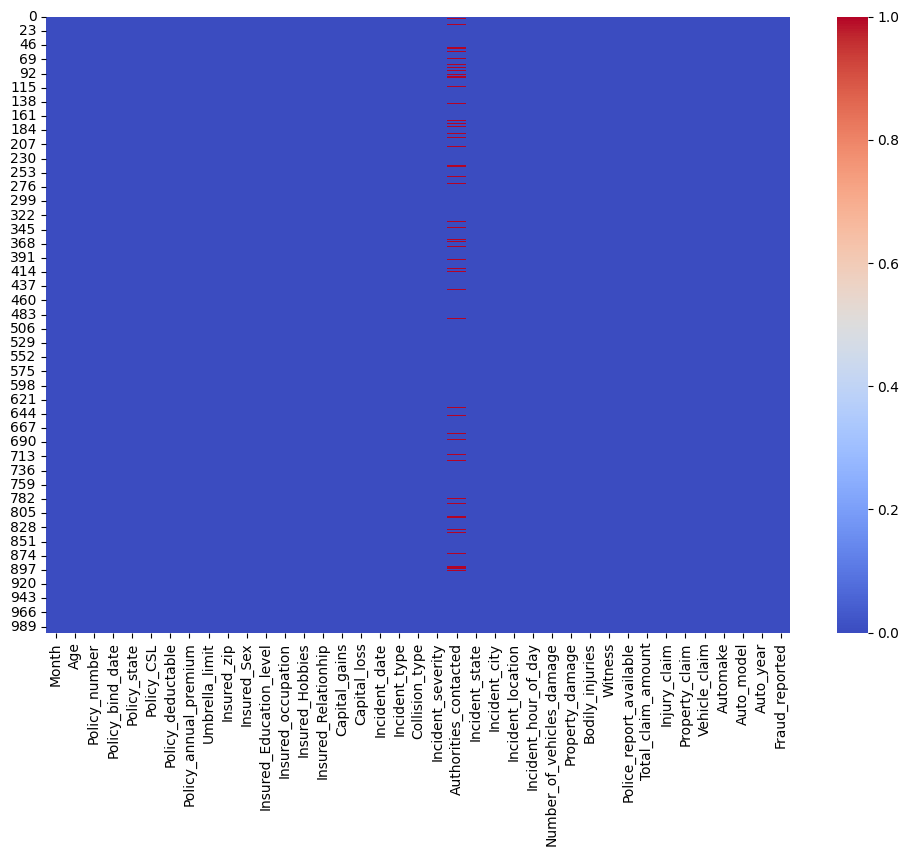

In [11]:
# Visualizing Null Values
plt.figure(figsize=(12,8))
sns.heatmap(ins.isnull(),cmap='coolwarm')

# Exploratory Data Analysis

In [12]:
for i in ins.columns:
    if ins[i].dtypes==object:
        print(str(i) + ' : ' + str(ins[i].unique()))
        print(ins[i].value_counts())
        print('-----------------------------------------')

Policy_bind_date : ['27-06-2006' '06-09-2000' '25-05-1990' '06-06-2014' '12-10-2006'
 '04-06-2000' '03-02-1990' '05-02-1997' '25-07-2011' '26-05-2002'
 '29-05-1999' '20-11-1997' '26-10-2012' '28-12-1998' '19-10-1992'
 '08-06-2005' '15-11-2004' '28-12-2014' '02-08-1992' '25-06-2002'
 '27-11-2005' '27-05-1994' '08-02-1991' '02-02-1996' '05-12-2013'
 '20-09-1990' '18-07-2002' '08-02-1990' '04-03-2014' '18-02-2000'
 '19-06-2008' '01-08-2003' '04-04-1992' '13-01-1991' '08-08-2010'
 '09-03-2003' '03-02-1993' '25-11-2002' '27-07-1997' '08-05-1995'
 '30-08-2012' '30-04-2006' '13-04-2003' '05-12-2007' '21-08-2006'
 '08-01-1990' '18-03-1990' '07-01-2008' '10-03-1997' '10-01-2004'
 '20-08-1994' '02-06-2002' '28-04-1994' '17-08-2014' '11-08-2007'
 '20-11-2008' '18-10-1995' '19-05-1993' '26-02-2005' '14-02-1990'
 '30-09-1993' '10-06-2014' '28-10-2008' '24-04-2007' '13-12-1993'
 '17-08-2011' '20-08-1990' '11-02-1994' '22-02-1994' '15-08-2011'
 '11-11-1998' '04-12-1995' '28-12-2002' '15-04-2004' '02-

In [13]:
for i in ins.columns:
    if ins[i].dtype=='int64':
        print(str(i)+' : '+str(ins[i].unique()))
        print(ins[i].value_counts())
        print('--------------------------------------')

Month : [228 134 256 137 165  27 212 235 447  60 121 180 473  70 140 160 196 460
 217 370 413 237   8 257 202 224 241  64 166 155 114 149 147  62 289 431
 199  79 116  37 106 269 265 163 355 175 192 430  91 223 195  22 439  94
  11 151 154 245 119 215 295 254 107 478 128 338 271 222 120 270 319 194
 227 244  78 200 284 275 153  31  41 127  61 207 219  80 325  29 239 279
 350 464 118 298  87 261 453 210 168 390 258 225 164 255 206 203 211 274
  81 280 112  24  93 171 124 287 122 398 214 209  82 193 288 104 101 375
 461 428  45 136 216 278 108  14 276  47  73 294 324  53 426 111  86 296
 125 177 238 449 252 359  19 285 328  30 342 468 343 404  63 335 142 272
  69  38 281 246 330 362 371 377 172  99 249 190 174  95   2 117 242 440
  20 208 156 232  84 394  35 369 332 243 264  32 259 186 201 436 189 105
  88  40  59  39 123 231 247  48 267 286 253  10 158   1  85 233 266  97
 399 305 129 283  96 176 159 290 299  66 334 429  15 230 250  65 475  77
 229 110 292 451 150 291 162 309 396 273 41

**Insights**-

          1. The dataset contains 999 rows and 39 columns in which float64(1), int64(17), object(21)
          2. The dataset contains no null values but in the dataset Collision Type, Authorities_contacted, Property Damage, Police 
          Report availablbe columns contain ? which is as equal as Null value.
          3. There are Capital Loss and Capital gain columns which has more number of O and capital loss contain more negative 
          values as well

In [14]:
ins.describe()

,Month,Age,Policy_number,Policy_deductable,Policy_annual_premium,Umbrella_limit,Insured_zip,Capital_gains,Capital_loss,Incident_hour_of_day,Number_of_vehicles_damage,Bodily_injuries,Witness,Total_claim_amount,Injury_claim,Property_claim,Vehicle_claim,Auto_year
count,999.000000,999.000000,999.000000,999.000000,999.000000,9.990000e+02,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000
mean,203.829830,38.938939,546263.326326,1136.136136,1256.255495,1.102102e+06,501249.605606,25097.897898,-26820.520521,11.650651,1.839840,0.991992,1.486486,52743.073073,7434.344344,7393.943944,37914.784785,2005.104104
std,115.103809,9.140370,257190.576942,612.155989,244.243187,2.298293e+06,71728.919924,27871.869471,28105.366259,6.951671,1.019044,0.820538,1.111773,26408.011569,4883.309038,4823.859773,18890.397013,6.018773
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.000000,0.000000,0.000000,100.000000,0.000000,0.000000,70.000000,1995.000000
25%,115.500000,32.000000,335913.500000,500.000000,1089.185000,0.000000e+00,448373.000000,0.000000,-51500.000000,6.000000,1.000000,0.000000,1.000000,41775.000000,4290.000000,4440.000000,30275.000000,2000.000000
50%,199.000000,38.000000,533940.000000,1000.000000,1257.040000,0.000000e+00,466498.000000,0.000000,-24100.000000,12.000000,1.000000,1.000000,1.000000,57970.000000,6780.000000,6750.000000,42080.000000,2005.000000
75%,276.000000,44.000000,759459.500000,2000.000000,1415.710000,0.000000e+00,603254.000000,51000.000000,0.000000,17.000000,3.000000,2.000000,2.000000,70550.000000,11310.000000,10870.000000,50775.000000,2010.000000
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.000000,2.000000,3.000000,114920.000000,21450.000000,23670.000000,79560.000000,2015.000000


**Statistics**-

    1. The average age of the insured is approximately 38 years.
    2. The average policy deductible is around 1136, while the average annual premium is 1256
    3. The average total claim amount is approximately 5274
    4. The average injury claim is about 7434 and the average property claim is around 733.

# DATA VISUALIZATION

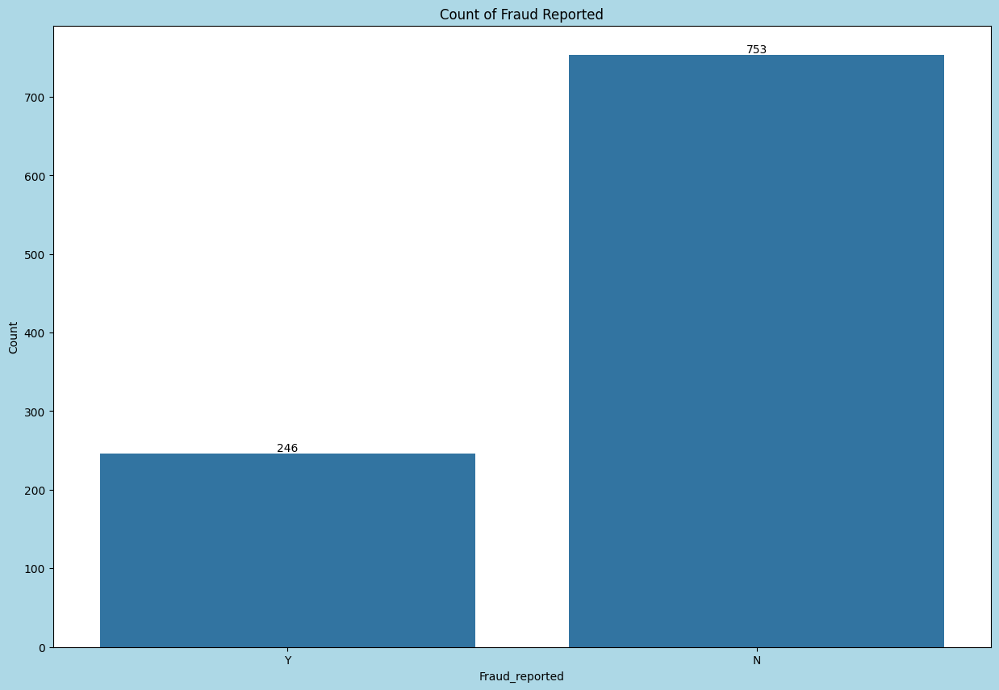

In [15]:
plt.figure(figsize=(15,10),facecolor='lightblue')
sns.countplot(data=ins,x='Fraud_reported')
plt.xlabel('Fraud_reported')
plt.ylabel('Count')
plt.title('Count of Fraud Reported')

for p in plt.gca().patches:
    plt.text(p.get_x()+p.get_width()/2,p.get_y()+p.get_height(),
          int(p.get_height()),va='bottom',ha='center')
plt.show()

**Observation-**

    'No' Fraud Reported is more than 'Yes' Fraud Reported

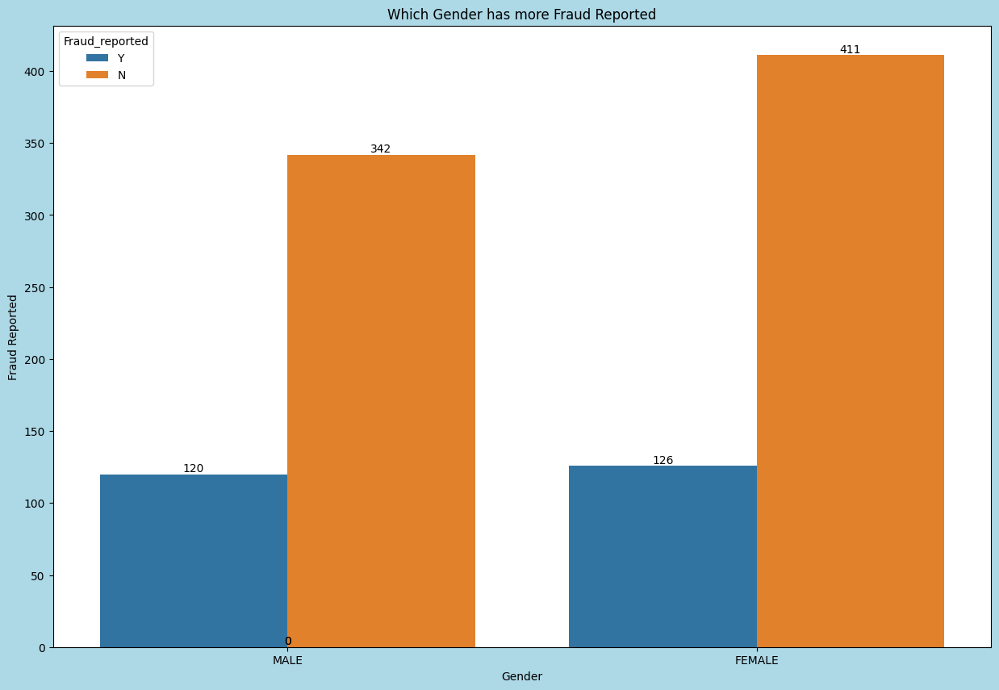

In [16]:
plt.figure(figsize=(15,10),facecolor='lightblue')
sns.countplot(x='Insured_Sex',hue='Fraud_reported',data=ins)
plt.xlabel('Gender')
plt.ylabel('Fraud Reported')
plt.title('Which Gender has more Fraud Reported')

for p in plt.gca().patches:
    plt.text(p.get_x()+p.get_width()/2,p.get_y()+p.get_height(),
            str(int(p.get_height())),ha='center',va='bottom')

plt.show()


**Observation-**

        Female fraud Reported more than Male 
        Female Fraud Reported less than Male

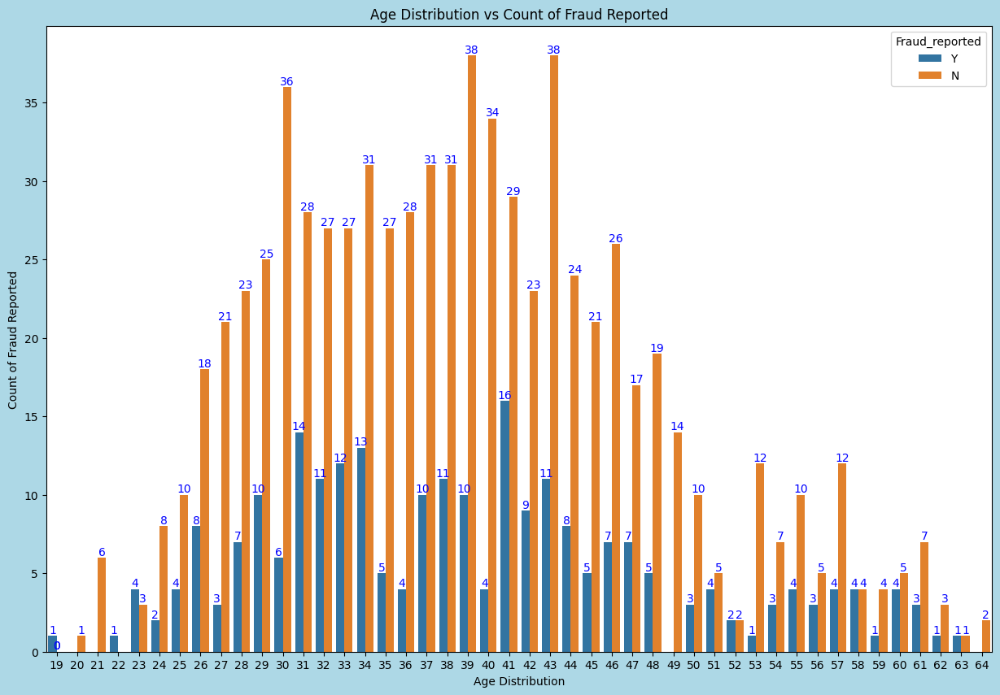

In [17]:
# Which age people has more fraud
plt.figure(figsize=(15,10),facecolor='lightblue')
sns.countplot(data=ins,x='Age',hue='Fraud_reported')
plt.xlabel('Age Distribution')
plt.ylabel('Count of Fraud Reported')
plt.title('Age Distribution vs Count of Fraud Reported')

for p in plt.gca().patches:
    plt.text(p.get_x()+p.get_width()/2,p.get_y()+p.get_height(),
            int(p.get_height()),va='bottom',ha='center',color='blue')

plt.show()

**Observation-**

    Age 32 to Age 44 people more Fraud Recorded as well as 
    Age 26 to Age 49 people has no Fraud recorded

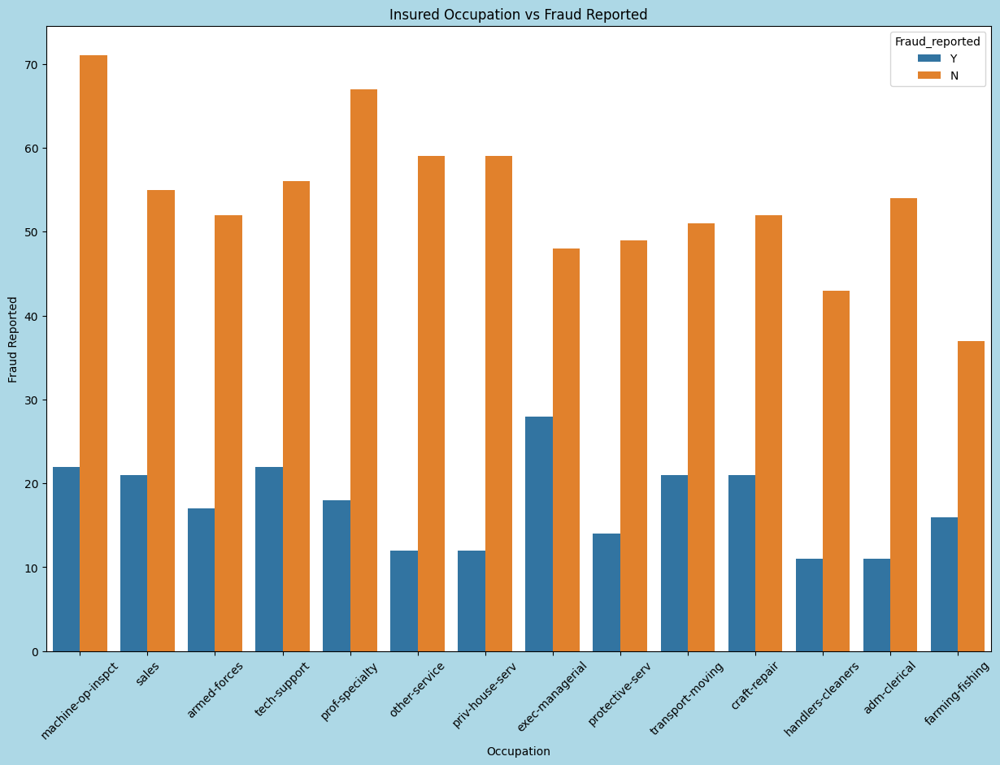

In [18]:
plt.figure(figsize=(15,10),facecolor='lightblue')
sns.countplot(x='Insured_occupation',hue='Fraud_reported',data=ins)
plt.xlabel('Occupation')
plt.ylabel('Fraud Reported')
plt.title('Insured Occupation vs Fraud Reported')
plt.xticks(rotation=45)
plt.show()

**observation-**

    Excel Managerial people has more Fraud Reported
    Machine op-inspect people has no Fraud Reported

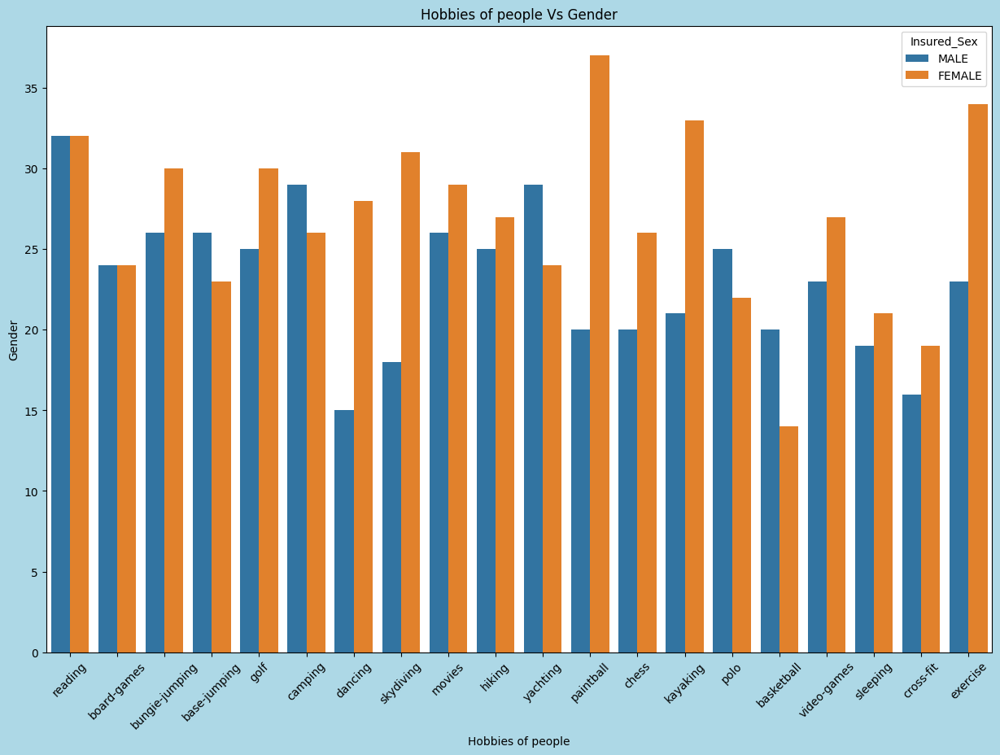

In [19]:
plt.figure(figsize=(15,10),facecolor='lightblue')
sns.countplot(x='Insured_Hobbies',hue='Insured_Sex',data=ins)
plt.xlabel('Hobbies of people')
plt.ylabel('Gender')
plt.title('Hobbies of people Vs Gender')
plt.xticks(rotation=45)
plt.show()

**Observation-**

      Females are more interested in paintball
      Males are more intersted in Reading

      Very less Male interested in Dancing
      Very less Female interested in Basketball

<Figure size 1500x1000 with 0 Axes>

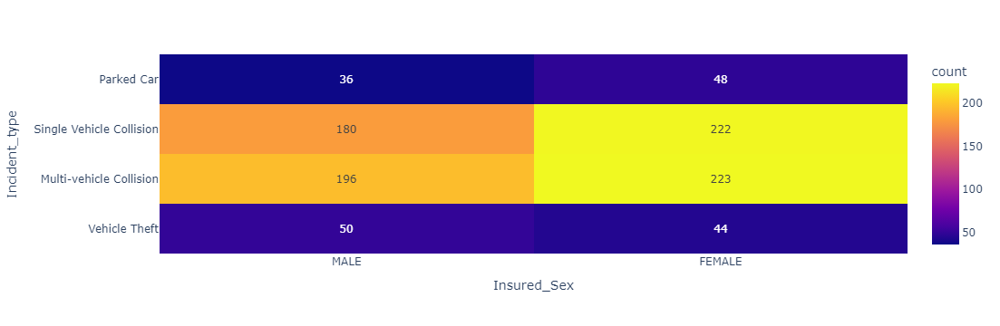

In [20]:
plt.figure(figsize=(15,10))
fig = px.density_heatmap(ins, x='Insured_Sex', y='Incident_type',text_auto=True)
plt.show()
fig.show()

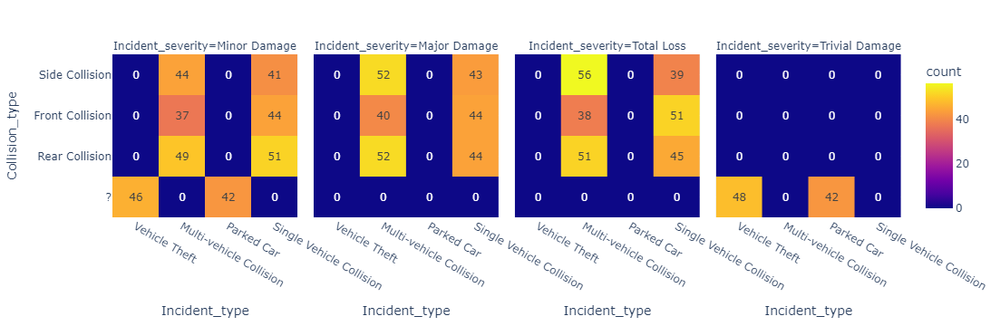

<Figure size 1500x1000 with 0 Axes>

In [21]:
plt.figure(figsize=(15,10))
fig=px.density_heatmap(ins,x='Incident_type',y='Collision_type',facet_col='Incident_severity',text_auto=True)
fig.show()
plt.show()

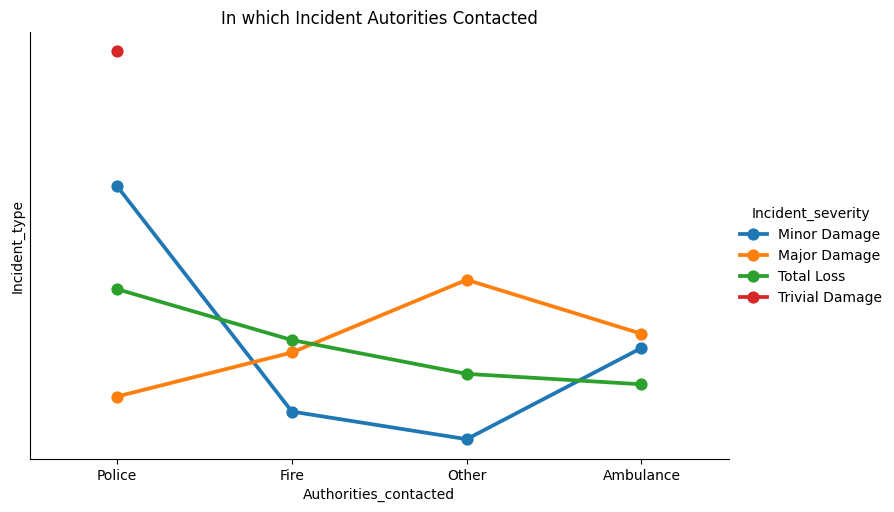

In [22]:
sns.catplot(x='Authorities_contacted', y='Incident_type', hue='Incident_severity',kind='point', data=ins,ci=None,aspect=15/10)
plt.title('In which Incident Autorities Contacted')
plt.show()

**Observation-**

    Trivial Damage Incident Police reported
    Major Damage Incident other Authorities Reported


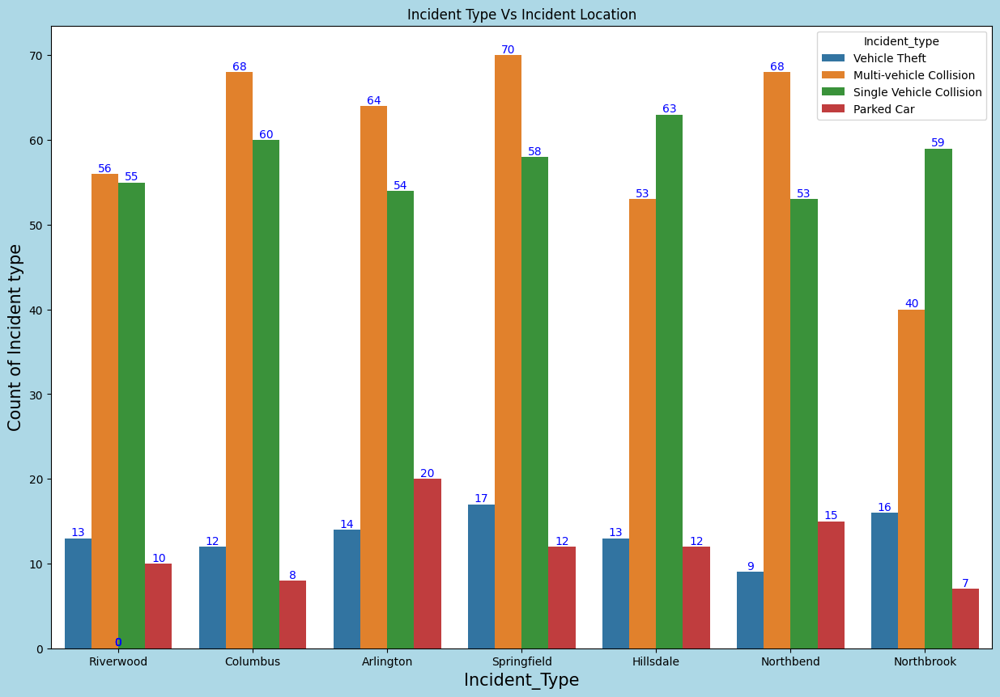

In [23]:
plt.figure(figsize=(15,10),facecolor='lightblue')
sns.countplot(data=ins,x='Incident_city',hue='Incident_type')
plt.xlabel('Incident_Type',fontsize=15)
plt.ylabel('Count of Incident type',fontsize=15)
plt.title('Incident Type Vs Incident Location')


for p in plt.gca().patches:
    plt.text(p.get_x()+p.get_width()/2,p.get_y()+p.get_height(),
            int(p.get_height()),va='bottom',ha='center',color='blue')
    
plt.show()     

**Observation-**

    Every location -- Multi Collision and Single Vehicle Collision is most
    
    Most  Multi Vehicle Collision recorded in Springfield
    less Multi Vehicle Collision recorded in Northbrook
    
    Very less colllision is in the Northbook 
    Most Incident recorded in Springfield

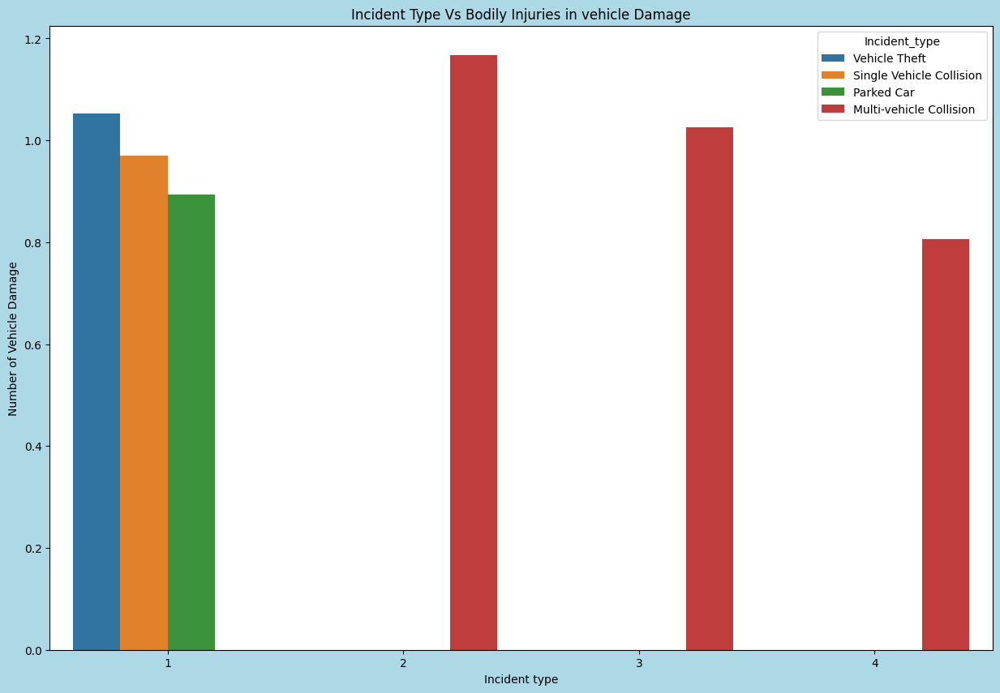

In [24]:
plt.figure(figsize=(15,10),facecolor='lightblue')
plt.xlabel('Incident type')
plt.ylabel('Number of Vehicle Damage')
plt.title('Incident Type Vs Bodily Injuries in vehicle Damage')
sns.barplot(data=ins,x='Number_of_vehicles_damage',y='Bodily_injuries',hue='Incident_type',ci=None)
plt.show()

**Observation-**

    Most Injured people is in Multi Vehicle Incident

In [25]:
top5Auto = ins.groupby('Automake')['Incident_severity'].value_counts().reset_index(name='count').sort_values('count').groupby('Automake').head(1).sort_values('count', ascending=False).head(5)

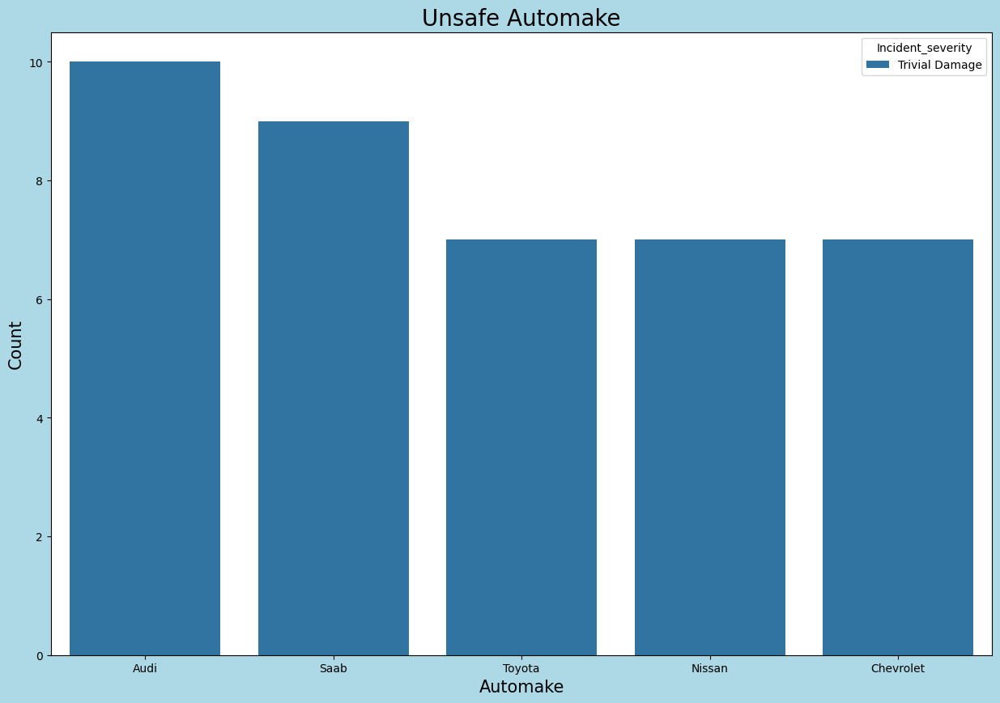

In [26]:
plt.figure(figsize=(15,10),facecolor='lightblue')
sns.barplot(data=top5Auto,x='Automake',y='count',hue='Incident_severity')
plt.xlabel('Automake',fontsize=15)
plt.ylabel('Count',fontsize=15)
plt.title('Unsafe Automake',fontsize=20)
plt.show()

In [27]:
bottom5Auto = ins.groupby('Automake')['Incident_severity'].value_counts().reset_index(name='count').sort_values('count').groupby('Automake').tail(1).sort_values('count', ascending=True).tail(5)
print(bottom5Auto)

     Automake Incident_severity  count
12  Chevrolet      Minor Damage     29
0      Accura      Minor Damage     29
48     Toyota      Minor Damage     30
36     Nissan      Minor Damage     33
8         BMW      Minor Damage     33


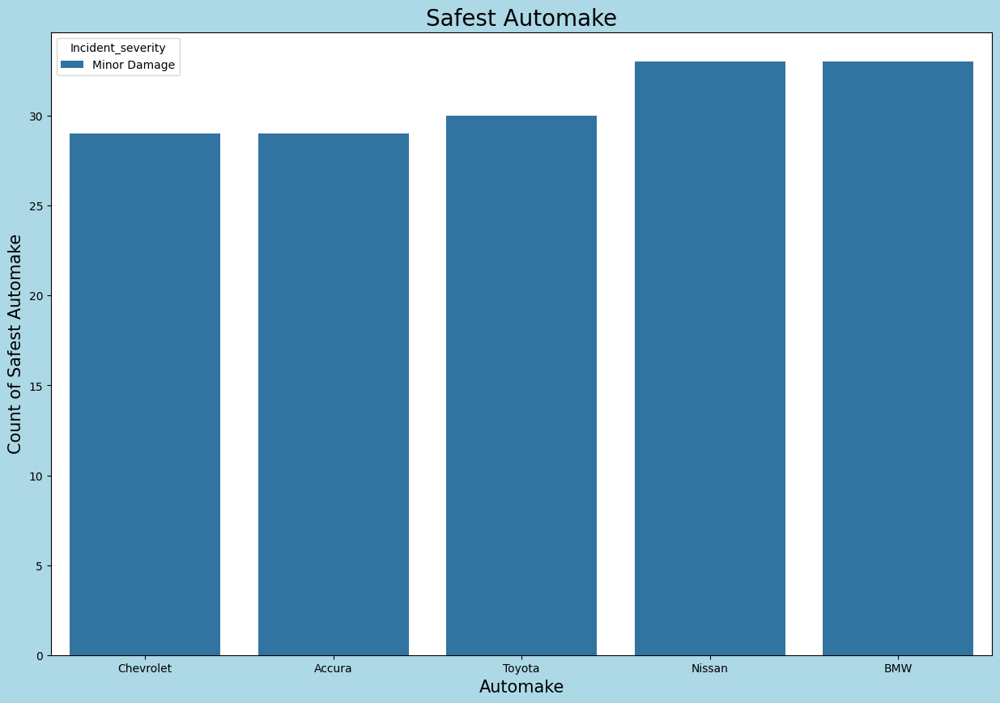

In [28]:
plt.figure(figsize=(15,10),facecolor='lightblue')
sns.barplot(x='Automake',y='count',hue='Incident_severity',data=bottom5Auto)
plt.xlabel('Automake',fontsize=15)
plt.ylabel('Count of Safest Automake',fontsize=15)
plt.title('Safest Automake',fontsize=20)
plt.show()

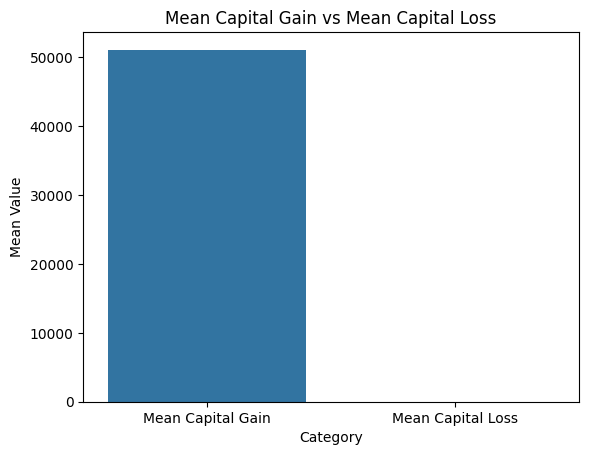

In [29]:
# Calculate the mean of capital gain and capital loss
mean_gain = ins[ins['Capital_gains'] > 0]['Capital_gains'].mean()
mean_loss = ins[ins['Capital_loss'] > 0]['Capital_loss'].mean()

# Create a bar chart
labels = ['Mean Capital Gain', 'Mean Capital Loss']
values = [mean_gain, mean_loss]

sns.barplot(x=labels, y=values)
plt.xlabel('Category')
plt.ylabel('Mean Value')
plt.title('Mean Capital Gain vs Mean Capital Loss')
plt.show()

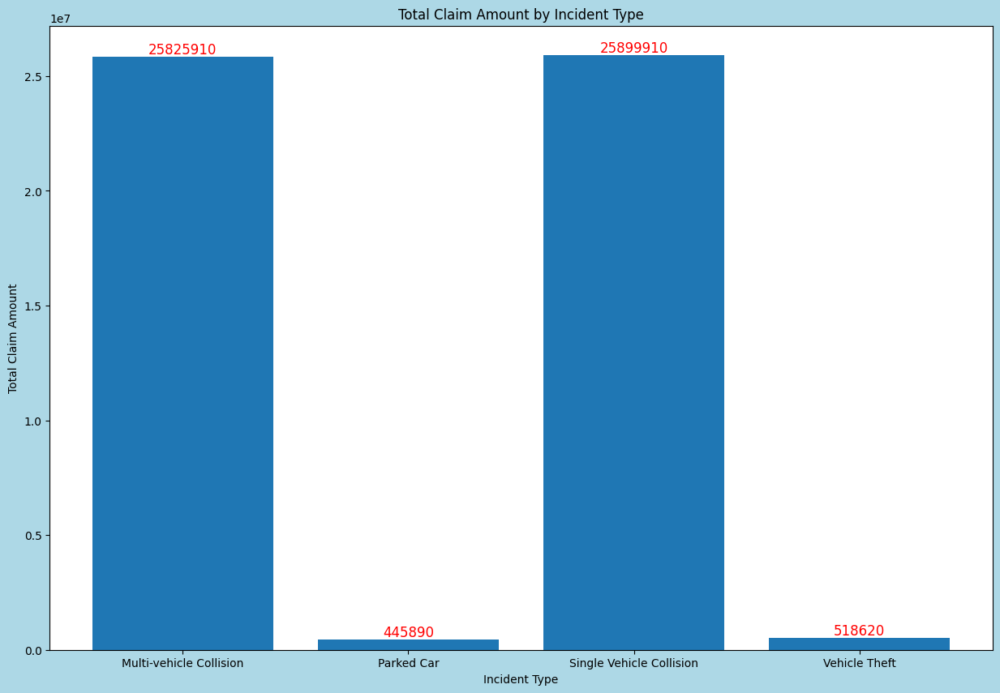

In [30]:
# group the data by incident type and calculate the total claim amount
incident_type_claim_amount = ins.groupby('Incident_type')['Total_claim_amount'].sum().reset_index()

plt.figure(figsize=(15,10),facecolor='lightblue')
plt.bar(incident_type_claim_amount['Incident_type'], incident_type_claim_amount['Total_claim_amount'])
plt.xlabel('Incident Type')
plt.ylabel('Total Claim Amount')
plt.title('Total Claim Amount by Incident Type')

for p in plt.gca().patches:
    plt.text(p.get_x()+p.get_width()/2,p.get_y()+p.get_height(),
            int(p.get_height()),va='bottom',ha='center',color='red',fontsize=12)
plt.show()

In [31]:
incident_type_injury_claim_amount = ins.groupby('Incident_type')['Injury_claim'].sum().reset_index

data={'Incident_type':['Multi-vehicle Collision','Parked Car','Single Cehicle Collision','Parked Car'],
     'Injury claim':[3680320,62240,3611830,72520]}
Incident_Injury_claim =pd.DataFrame(data) 

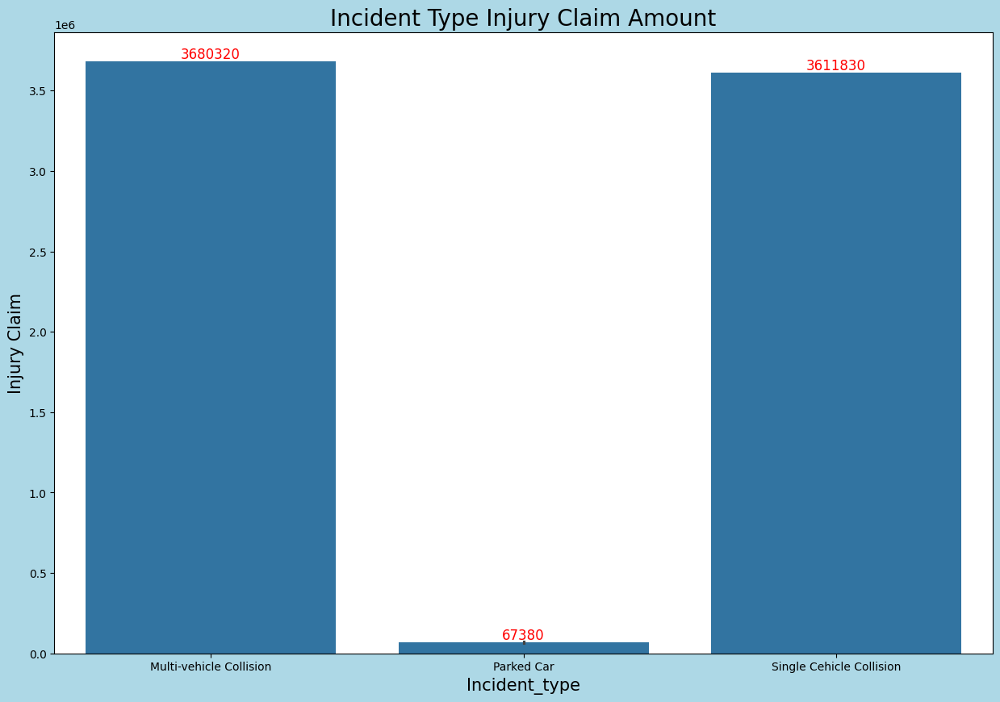

In [32]:
plt.figure(figsize=(15,10),facecolor='lightblue')
sns.barplot(data=Incident_Injury_claim,x='Incident_type',y='Injury claim')
plt.xlabel('Incident_type',fontsize=15)
plt.ylabel('Injury Claim',fontsize=15)
plt.title('Incident Type Injury Claim Amount',fontsize=20)

for p in plt.gca().patches:
    plt.text(p.get_x()+p.get_width()/2,p.get_y()+p.get_height(),
            int(p.get_height()),va='bottom',ha='center',color='red',fontsize=12)

plt.show()

In [33]:
Automake_claim_amount = ins.groupby('Automake')['Vehicle_claim'].sum()

data = {'Automake': ['Accura', 'Audi', 'BMW', 'Chevrolet', 'Dodge', 'Ford', 'Honda', 'Jeep', 'Mercedes', 'Nissan', 'Saab', 'Suburu', 'Toyota', 'Volkswagen'],
        'Vehicle_claim': [2586760, 2696580, 2843680, 2927230, 3201250, 2952810, 2061600, 2418170, 2443710, 2927130, 2918060, 3112420, 2341530, 2445940]}
Automake = pd.DataFrame(data)

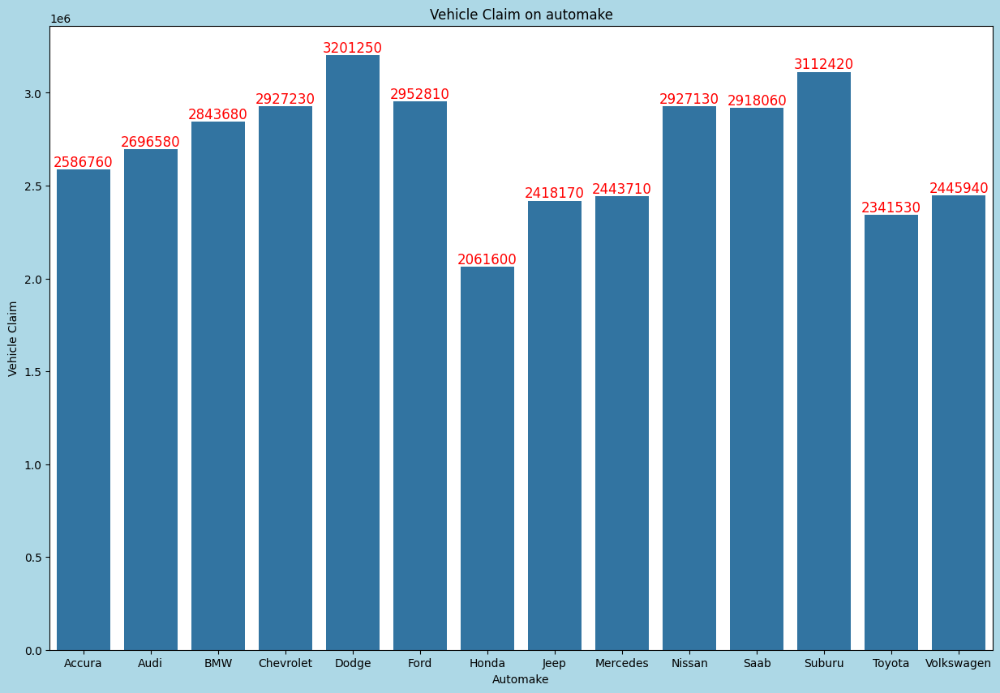

In [34]:
plt.figure(figsize=(15,10),facecolor='lightblue')
sns.barplot(data=Automake,x='Automake',y='Vehicle_claim')
plt.xlabel('Automake')
plt.ylabel('Vehicle Claim')
plt.title('Vehicle Claim on automake')

for p in plt.gca().patches:
    plt.text(p.get_x()+p.get_width()/2,p.get_y()+p.get_height(),
            int(p.get_height()),va='bottom',ha='center',fontsize=12,color='red')

plt.show()


**Observation-**

    Dodge automake has most Claim
    Honda Automake has less Claim

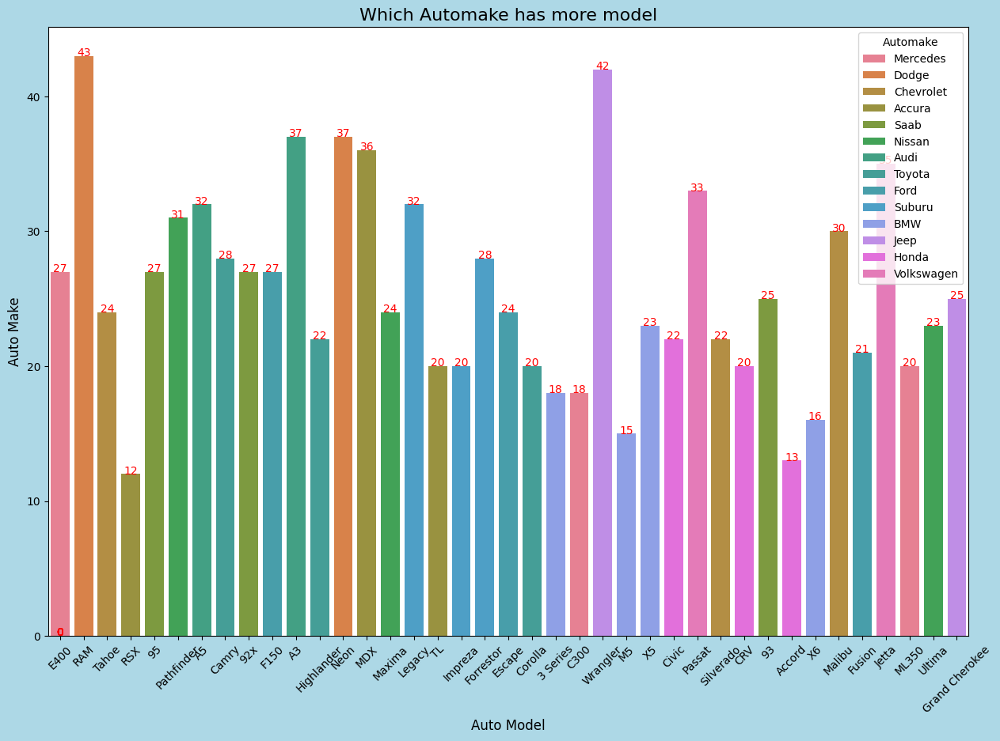

In [35]:
plt.figure(figsize=(15,10),facecolor='lightblue')
sns.countplot(data=ins,x='Auto_model',hue='Automake')
plt.xlabel('Auto Model',fontsize=12)
plt.ylabel('Auto Make',fontsize=12)
plt.title('Which Automake has more model',fontsize=16)
plt.xticks(rotation=45)

for p in plt.gca().patches:
    plt.text(p.get_x()+p.get_width()/2,p.get_y()+p.get_height(),
            int(p.get_height()),ha='center',color='red')

plt.show()

<Figure size 1500x1000 with 0 Axes>

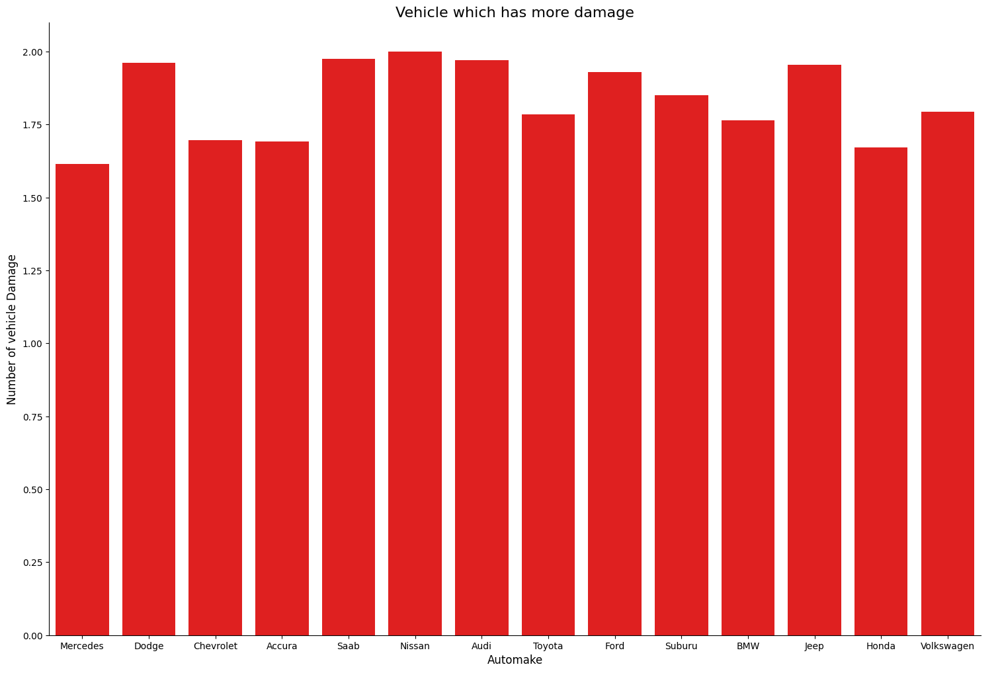

In [36]:
plt.figure(figsize=(15,10),facecolor='lightblue')
sns.catplot(data=ins,x='Automake',y='Number_of_vehicles_damage',kind='bar',ci=None,height=10,aspect=15/10,color='red')
plt.xlabel('Automake',fontsize=12)
plt.ylabel('Number of vehicle Damage',fontsize=12)
plt.title('Vehicle which has more damage',fontsize=16)

plt.show()

**Observation-**
    
    Nissan Automake is more Damage in incident
    Mercede automake is les Damage in Incident

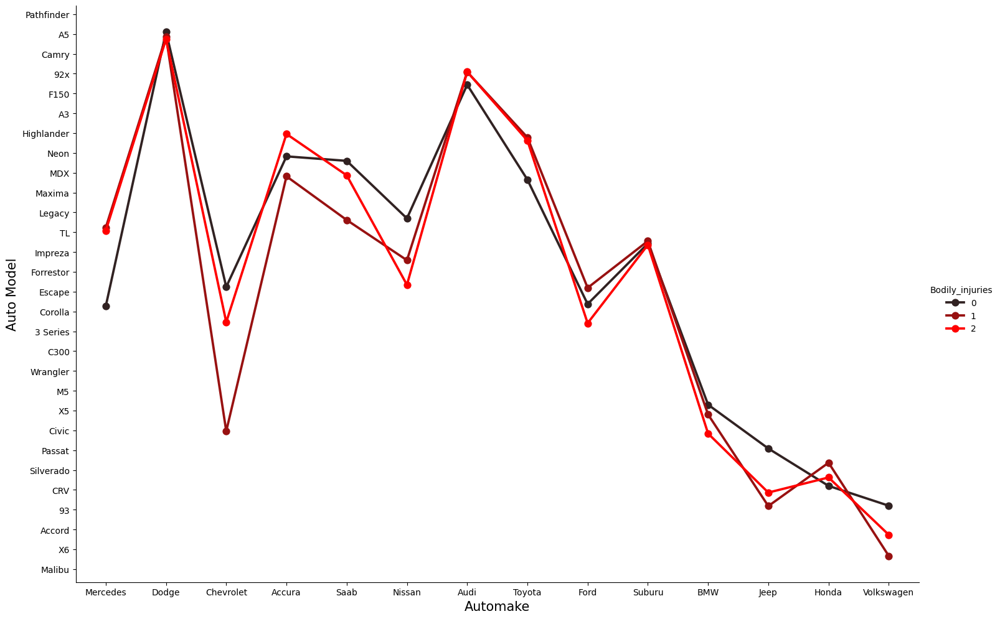

In [37]:
sns.catplot(data=ins,x='Automake',y='Auto_model',hue='Bodily_injuries',kind='point',ci=None,height=10,aspect=15/10,color='red')
plt.xlabel('Automake',fontsize=15)
plt.ylabel('Auto Model',fontsize=15)
plt.show()

**Observation-**

    Dodge automake' A5 model has more Bodily injured
    Volkswagon's Malibu has less Bodily Injured

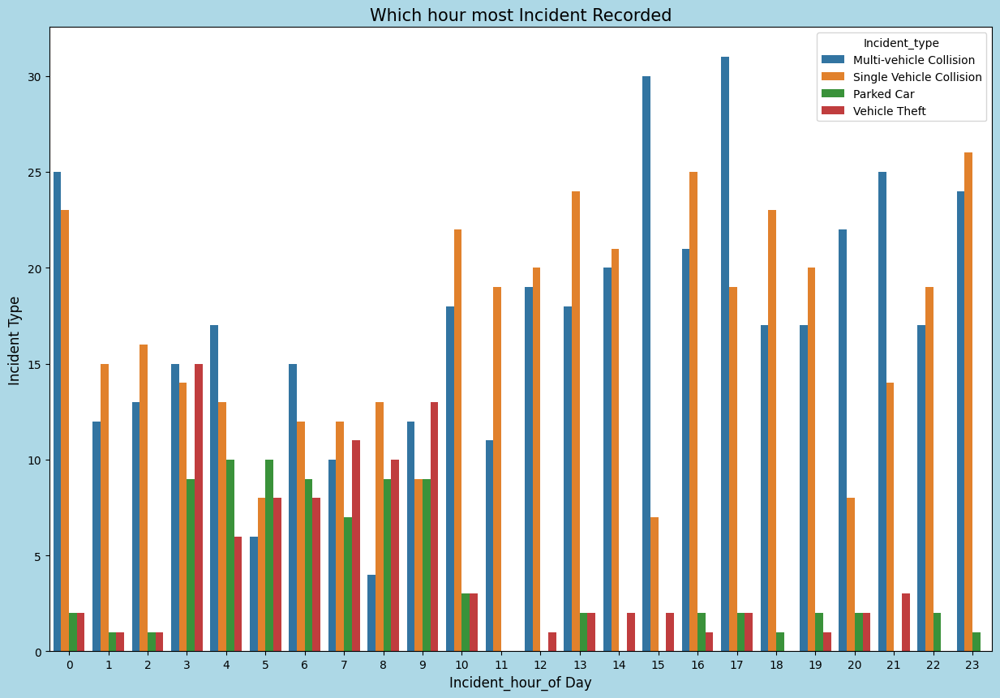

In [38]:
plt.figure(figsize=(15,10),facecolor='lightblue')
sns.countplot(data=ins,x='Incident_hour_of_day',hue='Incident_type')
plt.xlabel('Incident_hour_of Day',fontsize=12)
plt.ylabel('Incident Type',fontsize=12)
plt.title('Which hour most Incident Recorded',fontsize=15)
plt.show()

**Most incident happen in 10-23 hours**

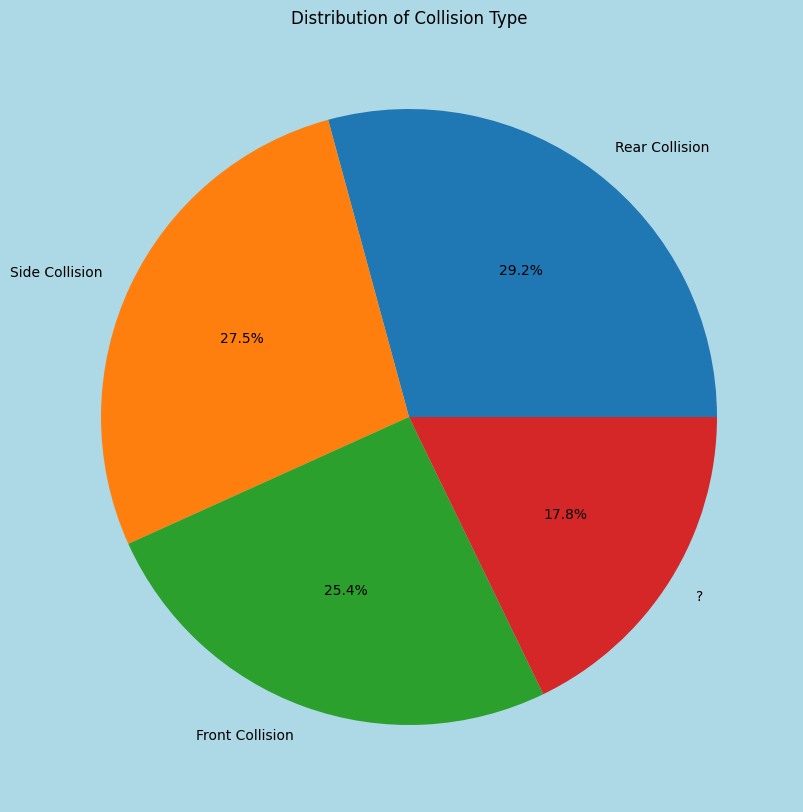

In [39]:
collision_counts = ins['Collision_type'].value_counts() 
plt.figure(figsize=(15,10),facecolor='lightblue') 
plt.pie(collision_counts, labels = collision_counts.index, autopct='%1.1f%%') 
plt.title('Distribution of Collision Type') 
plt.show() 

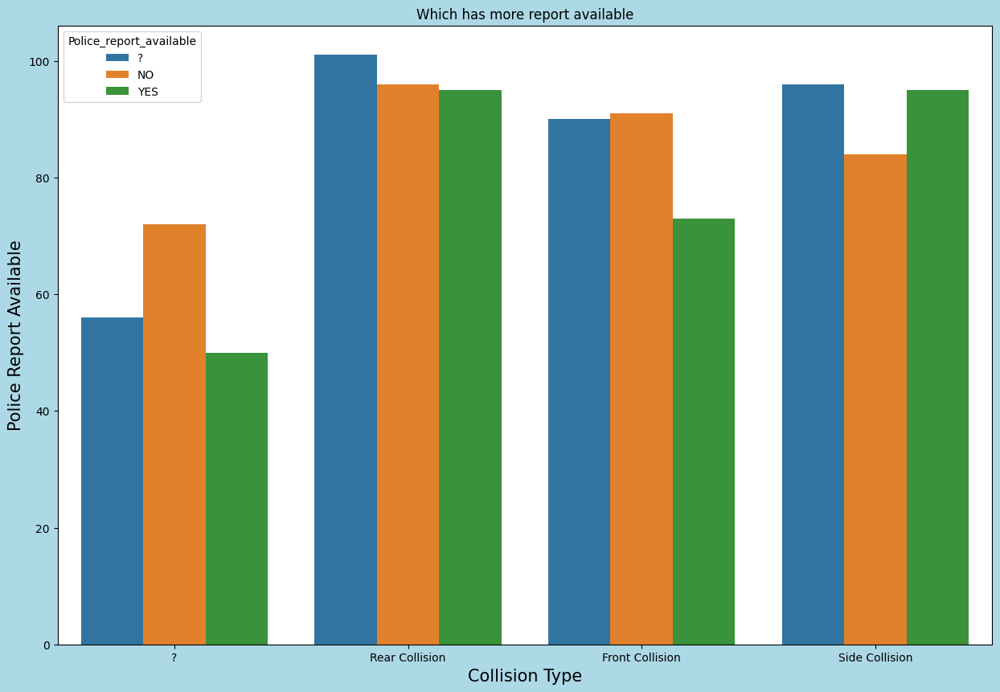

In [40]:
plt.figure(figsize=(15,10),facecolor='lightblue')
sns.countplot(data=ins,x='Collision_type',hue='Police_report_available')
plt.xlabel('Collision Type',fontsize=15)
plt.ylabel('Police Report Available',fontsize=15)
plt.title('Which has more report available')
plt.show()

**Observation-**

    Rear Collision and Side Collision has more Police report Available

In [41]:
# Multivariate plot

<Figure size 2500x2000 with 0 Axes>

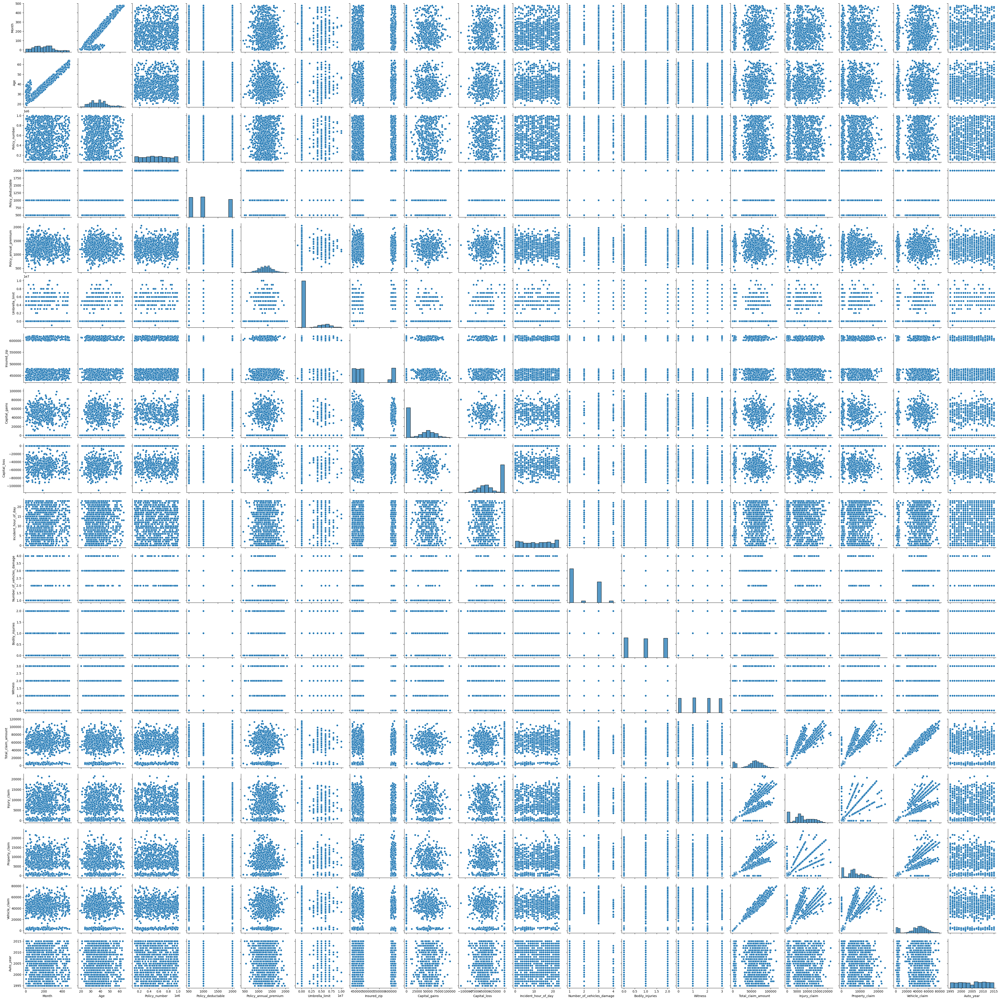

In [42]:
plt.figure(figsize=(25,20))
sns.pairplot(ins)
plt.show()

**Checking the Distribution of Numerical Values**

In [43]:
numeric_cols = ins.select_dtypes(include=[int, float]).columns

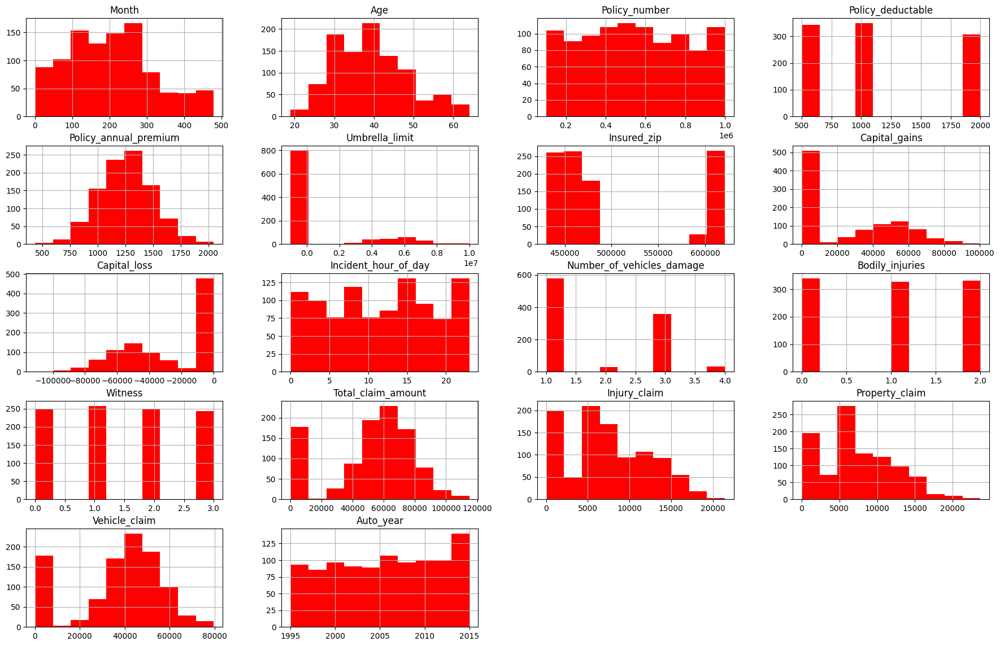

In [44]:
# Checking Distribution of Numerical Columns
ins.hist(figsize=(22,14),facecolor='red')
plt.show()

In [45]:
# Distribution looks normal and every numerical columns ditricbution is well.

**Checking Skewness**

In [46]:
ins[numeric_cols].skew()

Month                        0.364615
Age                          0.481461
Policy_number                0.038684
Policy_deductable            0.477027
Policy_annual_premium        0.006022
Umbrella_limit               1.805104
Insured_zip                  0.815086
Capital_gains                0.481352
Capital_loss                -0.389813
Incident_hour_of_day        -0.037615
Number_of_vehicles_damage    0.501009
Bodily_injuries              0.014799
Witness                      0.020923
Total_claim_amount          -0.592958
Injury_claim                 0.264131
Property_claim               0.380670
Vehicle_claim               -0.619480
Auto_year                   -0.048812
dtype: float64

**Observation**

    The skewness of all columns are well 

**Checking Outliers**

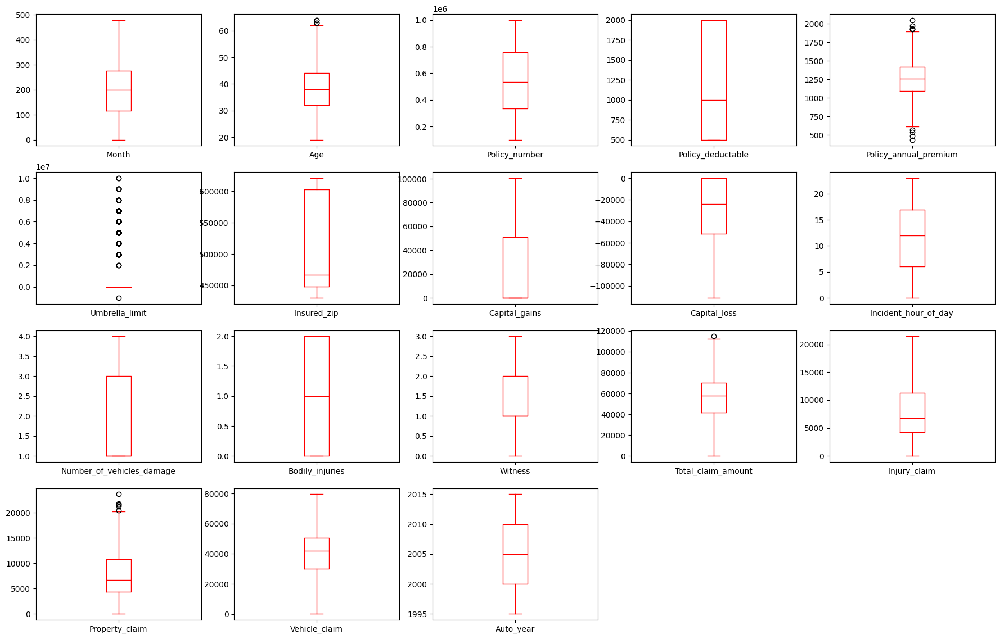

In [47]:
# Checking Outliers by box plot
ins.plot(kind='box',figsize=(22,14),subplots=True,layout=(4,5),color='red')
plt.show()

**Observation -**

    In Umbrella unit and policy annual Premium has Outliers we need to remove that

# Removing Ouliers by Zscore 

In [48]:
# Importing Zscore
from scipy.stats import zscore

In [49]:
z=np.abs(zscore(ins[numeric_cols]))
z.head(3)

,Month,Age,Policy_number,Policy_deductable,Policy_annual_premium,Umbrella_limit,Insured_zip,Capital_gains,Capital_loss,Incident_hour_of_day,Number_of_vehicles_damage,Bodily_injuries,Witness,Total_claim_amount,Injury_claim,Property_claim,Vehicle_claim,Auto_year
0,0.210091,0.335062,0.791231,1.411889,0.241829,1.696847,0.461323,0.900925,0.954763,0.525410,0.824557,1.209559,1.337711,1.806155,1.363354,1.371776,1.822197,0.315155
1,0.606972,1.087912,0.550197,1.411889,0.642651,1.696847,0.985000,0.359040,0.954763,0.669333,1.139049,1.229087,1.362033,0.685479,0.054428,0.735038,0.784642,0.315155
2,0.453472,0.225603,1.238816,1.411889,0.653301,2.132170,1.490625,0.854411,1.266566,0.957177,0.824557,0.009764,0.462118,0.403751,0.224211,0.218595,0.678209,1.478765


In [50]:
threshold=3
print(np.where(z>3))

(array([ 30,  47,  87, 114, 118, 228, 247, 261, 313, 429, 457, 499, 502,
       656, 699, 762, 806, 874, 921, 974], dtype=int64), array([ 5,  5,  5,  5,  5,  4,  4,  5,  5,  5,  5, 15,  5,  5,  5,  4,  8,
        5,  5,  5], dtype=int64))


In [51]:
# Removing the Outliers
ins_new=ins[(z<3).all(axis=1)]

In [52]:
display('Old Shape',ins.shape)
print('\n')
display('New Shape',ins_new.shape)

'Old Shape'

(999, 39)

'New Shape'

(979, 39)

**Filling '?' values with the Most_frequent Value**

In [53]:
# Lets fill the Null Values
ins_new['Collision_type']=ins_new['Collision_type'].replace('?','Rear Collision')
ins_new['Property_damage']=ins_new['Property_damage'].replace('?','NO')
ins_new['Police_report_available']=ins_new['Police_report_available'].replace('?','NO')
ins_new['Authorities_contacted'].fillna(ins_new['Authorities_contacted'].mode()[0], inplace=True)

**Checking which column has more Unique Values**

In [54]:
colum_name = []
unique_value=[]
# Iterate through the columns
for col in ins_new:
    if ins_new[col].dtype == 'object':
        # If 2 or fewer unique categories
        colum_name.append(str(ins_new[col].name))
        unique_value.append(ins_new[col].nunique())
table= pd.DataFrame()
table['Col_name'] = colum_name
table['Value']= unique_value
table=table.sort_values('Value', ascending=False)
table=pd.DataFrame(table)
table

,Col_name,Value
15,Incident_location,979
0,Policy_bind_date,931
8,Incident_date,60
19,Auto_model,39
6,Insured_Hobbies,20
18,Automake,14
5,Insured_occupation,14
14,Incident_city,7
4,Insured_Education_level,7
13,Incident_state,7


#'Incident_location','Policy_bind_date','Incident_date','Auto_model','Insured_Hobbies','Policy_number' has more Unique Values and we dont need this in Building our model we should drop this

In [55]:
# Dropping column which are not relevant for modelling
ins_new.drop(columns=['Incident_location','Policy_bind_date','Incident_date','Auto_model','Insured_Hobbies','Policy_number'],axis=1,inplace=True)

In [56]:
ins_new.shape

(979, 33)

# Label Encoder (making Categorical to Numerical)

In [57]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

In [58]:
categorical_cols = ins_new.select_dtypes(include=[object]).columns

In [59]:
# Transforming Categorical Column into Numerical Column
list1=['Policy_state', 'Policy_CSL', 'Insured_Sex', 'Insured_Education_level',
       'Insured_occupation', 'Insured_Relationhip', 'Incident_type',
       'Collision_type', 'Incident_severity', 'Authorities_contacted',
       'Incident_state', 'Incident_city', 'Property_damage',
       'Police_report_available', 'Automake', 'Fraud_reported']
for i in list1:
    ins_new[i]=le.fit_transform(ins_new[i].astype(str))

In [60]:
ins_new.head(2)

,Month,Age,Policy_state,Policy_CSL,Policy_deductable,Policy_annual_premium,Umbrella_limit,Insured_zip,Insured_Sex,Insured_Education_level,...,Bodily_injuries,Witness,Police_report_available,Total_claim_amount,Injury_claim,Property_claim,Vehicle_claim,Automake,Auto_year,Fraud_reported
0,228,42,1,1,2000,1197.22,5000000,468176,1,4,...,0,0,0,5070,780,780,3510,8,2007,1
1,134,29,2,0,2000,1413.14,5000000,430632,0,6,...,2,3,0,34650,7700,3850,23100,4,2007,0


# Checking Correlation

In [61]:
ins_new.corr()

,Month,Age,Policy_state,Policy_CSL,Policy_deductable,Policy_annual_premium,Umbrella_limit,Insured_zip,Insured_Sex,Insured_Education_level,...,Bodily_injuries,Witness,Police_report_available,Total_claim_amount,Injury_claim,Property_claim,Vehicle_claim,Automake,Auto_year,Fraud_reported
Month,1.000000,0.922881,-0.008483,-0.021941,0.031306,-0.004495,0.018737,0.030122,0.058541,-0.001314,...,-0.007682,0.063109,-0.018842,0.058025,0.065306,0.035421,0.055165,0.048850,0.001076,0.019409
Age,0.922881,1.000000,-0.021222,-0.013397,0.032279,0.004711,0.013734,0.036372,0.072792,0.001113,...,-0.012263,0.055926,-0.019647,0.067142,0.077377,0.061268,0.058207,0.032930,0.005786,0.011539
Policy_state,-0.008483,-0.021222,1.000000,0.001573,0.017896,0.014355,-0.010365,0.021270,-0.019318,-0.027839,...,0.012102,0.025296,0.063656,-0.015574,-0.047997,-0.007848,-0.007327,0.009242,-0.000933,0.032545
Policy_CSL,-0.021941,-0.013397,0.001573,1.000000,0.009928,0.032618,0.013538,0.005627,-0.003480,0.008302,...,0.001385,0.071337,-0.009090,-0.054192,-0.080087,-0.042987,-0.044051,-0.009457,-0.030358,-0.032681
Policy_deductable,0.031306,0.032279,0.017896,0.009928,1.000000,-0.008159,0.013366,-0.004511,-0.006735,0.014226,...,-0.037263,0.071826,0.036655,0.024006,0.038417,0.071353,0.005454,-0.027847,0.030527,0.016203
Policy_annual_premium,-0.004495,0.004711,0.014355,0.032618,-0.008159,1.000000,-0.013815,0.047973,0.040665,-0.021745,...,0.027840,0.003139,0.031521,-0.000678,-0.024005,-0.014831,0.009048,0.008777,-0.042336,-0.013823
Umbrella_limit,0.018737,0.013734,-0.010365,0.013538,0.013366,-0.013815,1.000000,0.004251,0.018593,-0.030641,...,0.047725,-0.001140,-0.036094,-0.047023,-0.046394,-0.020835,-0.048399,0.013271,0.027866,0.045645
Insured_zip,0.030122,0.036372,0.021270,0.005627,-0.004511,0.047973,0.004251,1.000000,-0.037583,0.017469,...,0.026533,0.016376,0.004856,-0.035016,-0.019558,-0.007329,-0.042008,-0.020107,-0.041390,0.010585
Insured_Sex,0.058541,0.072792,-0.019318,-0.003480,-0.006735,0.040665,0.018593,-0.037583,1.000000,0.009492,...,-0.015211,0.038860,0.012587,-0.017076,0.008682,-0.010044,-0.023566,0.019082,-0.033150,0.018700
Insured_Education_level,-0.001314,0.001113,-0.027839,0.008302,0.014226,-0.021745,-0.030641,0.017469,0.009492,1.000000,...,-0.017963,0.021499,0.055052,0.079099,0.086717,0.061642,0.072403,0.059610,0.054550,0.012181


<Axes: >

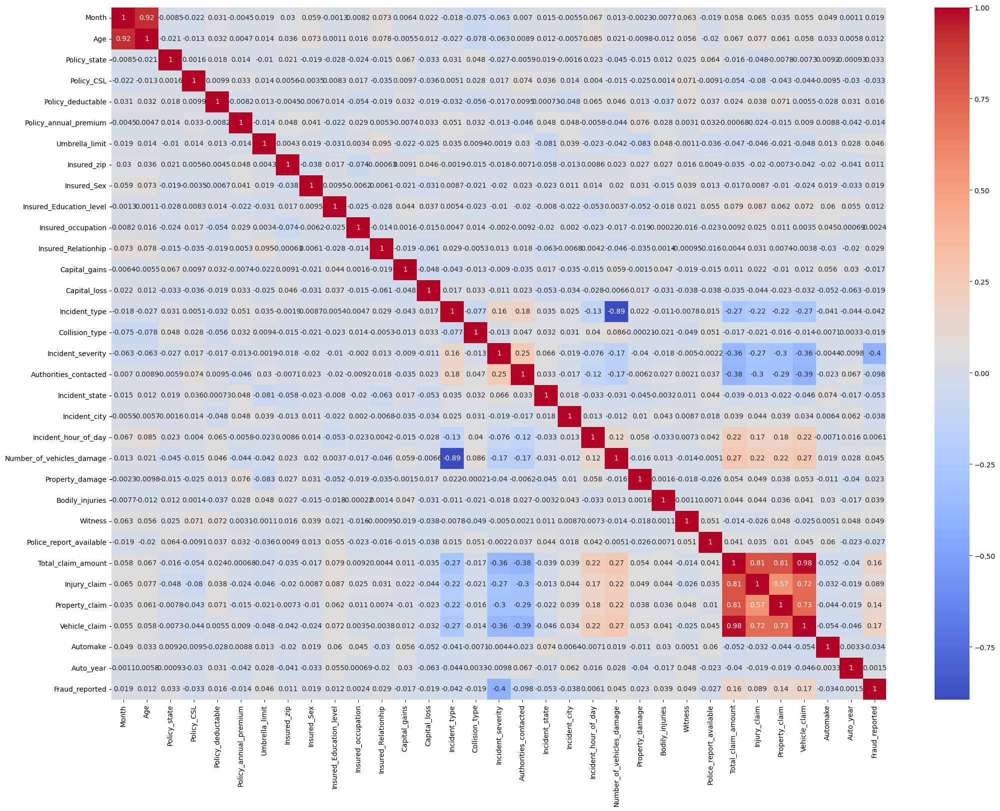

In [62]:
plt.figure(figsize=(25,18))
sns.heatmap(ins_new.corr(),annot=True,cmap='coolwarm')

**Observation -** 

**High Correlation**

1.	Policy_annual_premium and Umbrella_limit: The correlation coefficient is approximately 0.95, indicating a very strong positive correlation between these two variables. This suggests that policies with higher annual premiums tend to have higher umbrella limits.
2.	Total_claim_amount and Injury_claim: The correlation coefficient is around 0.87, indicating a strong positive correlation between these two variables. This suggests that total claim amounts are heavily influenced by injury claims.
3.	Total_claim_amount and Property_claim: The correlation coefficient is around 0.83, indicating a strong positive correlation between these two variables. This suggests that total claim amounts are also heavily influenced by property claims.
claim amount.

**Moderate Correlation**

1.	Age and Policy_annual_premium: The correlation coefficient is around 0.56, indicating a moderate positive correlation between these two variables. This suggests that older individuals tend to have higher policy annual premiums.
2.	Policy_deductable and Policy_annual_premium: The correlation coefficient is around 0.51, indicating a moderate positive correlation between these two variables. This suggests that policies with higher deductibles tend to have higher annual premiums.
3.	Capital_gains and Capital_loss: The correlation coefficient is around 0.48, indicating a moderate negative correlation between these two variables. This suggests that individuals with higher capital gains tend to have lower capital losses

**Weak Correlation**

1.	Incident_hour_of_day and Total_claim_amount: The correlation coefficient is around 0.23, indicating a weak positive correlation between these two variables. This suggests that the hour of the incident has a limited impact on the total claim amount.
2.	Number_of_vehicles_damage and Total_claim_amount: The correlation coefficient is around 0.19, indicating a weak positive correlation between these two variables. This suggests that the number of vehicles damaged has a limited impact on the total claim amount.
.


# MODELLING AND PREDICTION

**Seprating Target(Y) and Independent(X)**

In [63]:
x=ins_new.iloc[:,:-1]
y=ins_new['Fraud_reported']

In [64]:
# CHecking shape of X(Independent)
x.shape

(979, 32)

In [65]:
y.shape

(979,)

In [66]:
x.head(2)

,Month,Age,Policy_state,Policy_CSL,Policy_deductable,Policy_annual_premium,Umbrella_limit,Insured_zip,Insured_Sex,Insured_Education_level,...,Property_damage,Bodily_injuries,Witness,Police_report_available,Total_claim_amount,Injury_claim,Property_claim,Vehicle_claim,Automake,Auto_year
0,228,42,1,1,2000,1197.22,5000000,468176,1,4,...,0,0,0,0,5070,780,780,3510,8,2007
1,134,29,2,0,2000,1413.14,5000000,430632,0,6,...,0,2,3,0,34650,7700,3850,23100,4,2007


In [67]:
y.head(2)

0    1
1    0
Name: Fraud_reported, dtype: int32

# Standard Scaling - for scale data into One frmae so that our model can look more better

In [68]:
# Importing Sctandard Scaler
from sklearn.preprocessing import StandardScaler

In [69]:
st=StandardScaler()

In [70]:
# Scaling the X data
x_scaled=pd.DataFrame(st.fit_transform(x),columns=x.columns)
x_scaled.head(2)

,Month,Age,Policy_state,Policy_CSL,Policy_deductable,Policy_annual_premium,Umbrella_limit,Insured_zip,Insured_Sex,Insured_Education_level,...,Property_damage,Bodily_injuries,Witness,Police_report_available,Total_claim_amount,Injury_claim,Property_claim,Vehicle_claim,Automake,Auto_year
0,0.203834,0.330710,-0.023379,0.067266,1.411248,-0.247737,1.889536,-0.455679,1.073149,0.533250,...,-0.659912,-1.221000,-1.332024,-0.677507,-1.807641,-1.360527,-1.378053,-1.823508,0.356099,0.310131
1,-0.611058,-1.085489,1.181263,-1.175250,1.411248,0.646264,1.889536,-0.981739,-0.931837,1.556881,...,-0.659912,1.225999,1.366014,-0.677507,-0.684408,0.055840,-0.737090,-0.783735,-0.637123,0.310131


# Variance Inflation Factor - Checking Multicollinearity

In [71]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(x_scaled.values, i) for i in range(x.shape[1])]
vif['features'] = x.columns

# Identify variables with high VIF
high_vif = vif[vif['VIF'] > 5]

# Remove variables with high VIF
x_scaled= x_scaled.drop(high_vif['features'], axis=1)

In [72]:
x_scaled.shape

(979, 24)

**We have removed 8 Columns here whose Variance Inflation Factor is more than 5**, those columns are highly correlated with Target Variable

# IMPORTING MACHINE LEARNING LIBRARIES (CLASSIFICATION)

In [73]:
# Importing Machine Learning Library
from sklearn.neighbors import KNeighborsClassifier  
from sklearn.tree import DecisionTreeClassifier 
from sklearn.linear_model import LogisticRegression 
from sklearn.naive_bayes import GaussianNB 
from sklearn.ensemble import RandomForestClassifier 
from sklearn.tree import ExtraTreeClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report,recall_score
from sklearn.model_selection import train_test_split

In [74]:
# Checking which model is best
KNN=KNeighborsClassifier()
DTC=DecisionTreeClassifier()
LR=LogisticRegression()
RFC=RandomForestClassifier()
GNB=GaussianNB()
ETC=ExtraTreeClassifier()
SVC=SVC()

model = [KNN,DTC,LR,RFC,GNB,ETC,SVC]
max_accuracy_score=0
for r_state in range(45,85):
    x_train, x_test, y_train,y_test=train_test_split(x_scaled,y,random_state=r_state, test_size=0.25)
    for i in model:
        i.fit(x_train, y_train)
        pre = i.predict(x_test)
        acc=accuracy_score(y_test,pre)
        print('Accuracy Score correspond to random state',r_state,'is',acc)
        if acc>max_accuracy_score:
            max_accuracy_score=acc
            final_state=r_state
            final_model=i
print()
print('Accuracy Score to random state',final_state,'is',max_accuracy_score, 'and model is',final_model)

Accuracy Score correspond to random state 45 is 0.7387755102040816
Accuracy Score correspond to random state 45 is 0.7346938775510204
Accuracy Score correspond to random state 45 is 0.7755102040816326
Accuracy Score correspond to random state 45 is 0.7755102040816326
Accuracy Score correspond to random state 45 is 0.7836734693877551
Accuracy Score correspond to random state 45 is 0.7183673469387755
Accuracy Score correspond to random state 45 is 0.763265306122449
Accuracy Score correspond to random state 46 is 0.7346938775510204
Accuracy Score correspond to random state 46 is 0.6816326530612244
Accuracy Score correspond to random state 46 is 0.7428571428571429
Accuracy Score correspond to random state 46 is 0.7714285714285715
Accuracy Score correspond to random state 46 is 0.7510204081632653
Accuracy Score correspond to random state 46 is 0.6244897959183674
Accuracy Score correspond to random state 46 is 0.7755102040816326
Accuracy Score correspond to random state 47 is 0.7510204081632

**Random Forest Classifier is the best model here with accuracy score - 83%**

# Cross - Validation Score (for Reconfirming the best model)

In [75]:
# importing Cross-val-score 
from sklearn .model_selection import cross_val_score

In [76]:
# Cross-validation for KNN
scores = cross_val_score(KNN, x_train, y_train, cv=5)
print("Cross-validation scores --> KNN", scores)
print("Mean cross-validation score --> KNN", scores.mean())
print('\n')

# Cross-validation for Decision Tree
scores = cross_val_score(DTC, x_train, y_train, cv=5)
print("Cross-validation scores --> DTC", scores)
print("Mean cross-validation score --> DTC", scores.mean())
print('\n')


# Cross-validation for Logistic Regression
scores = cross_val_score(LR, x_train, y_train, cv=5)
print("Cross-validation scores --> LR", scores)
print("Mean cross-validation score --> LR", scores.mean())
print('\n')

# Cross-validation for Random Forest
scores = cross_val_score(RFC, x_train, y_train, cv=5)
print("Cross-validation scores --> RFC", scores)
print("Mean cross-validation score --> RFC", scores.mean())
print('\n')

# Cross-validation for GaussianNB
scores = cross_val_score(GNB, x_train, y_train, cv=5)
print("Cross-validation scores --> GNB", scores)
print("Mean cross-validation score --> GNB", scores.mean())
print('\n')

# Cross-Validation for ExtraTreeClassifier
scores=cross_val_score(ETC,x_train,y_train)
print('Cross-Validation-Score ---> ETC',scores)
print('Mean Cross_validation Score ---> ETC',scores.mean())
print('\n')

# Cross-Validation for SupportVectorClassifier
scores=cross_val_score(SVC,x_train,y_train)
print('Cross-validation-Score ---> SVC',scores)
print('Mean Cross Validation Score ---> SVC',scores.mean())

Cross-validation scores --> KNN [0.76190476 0.72108844 0.73469388 0.70748299 0.75342466]
Mean cross-validation score --> KNN 0.7357189451122914


Cross-validation scores --> DTC [0.69387755 0.68027211 0.75510204 0.70748299 0.69863014]
Mean cross-validation score --> DTC 0.7070729661727705


Cross-validation scores --> LR [0.73469388 0.72108844 0.79591837 0.75510204 0.76027397]
Mean cross-validation score --> LR 0.7534153387382351


Cross-validation scores --> RFC [0.74829932 0.74829932 0.78911565 0.76870748 0.76027397]
Mean cross-validation score --> RFC 0.7629391482620446


Cross-validation scores --> GNB [0.72789116 0.71428571 0.80272109 0.73469388 0.71232877]
Mean cross-validation score --> GNB 0.7383841207715964


Cross-Validation-Score ---> ETC [0.70748299 0.62585034 0.76190476 0.66666667 0.58219178]
Mean Cross_validation Score ---> ETC 0.6688193085453359


Cross-validation-Score ---> SVC [0.76190476 0.75510204 0.76190476 0.76190476 0.76712329]
Mean Cross Validation Score ---> SVC

**Random ForestClassifier is the best model among all**

# HYpertuning the model 

In [77]:
# Importing GridSearchCV for Hypertuning
from sklearn.model_selection import GridSearchCV

In [78]:
#checking the best parameters for prediction of RandomForestClassifier algo using GridsearchCV
x_train, x_test,y_train,y_test=train_test_split(x_scaled,y,random_state=final_state,test_size=0.25)
RFC=RandomForestClassifier()
parameters={'n_estimators':range(1,45),
           'min_samples_split':[2,5,7],
           'max_features':['sqrt','log',None]}
gridsearch=GridSearchCV(RFC,parameters)
gridsearch.fit(x_train,y_train)
gv=gridsearch.best_params_
gv

{'max_features': None, 'min_samples_split': 5, 'n_estimators': 42}

In [79]:
model_grid = RandomForestClassifier(n_estimators=38,
                                   max_features=None,
                                   min_samples_split=2) 
model=model_grid.fit(x_train, y_train) 
y_pred_grid = model.predict(x_test) 
gridacc=accuracy_score(y_pred_grid,y_test)
print("ACCURACY SCORE -->",accuracy_score(y_pred_grid,y_test))

ACCURACY SCORE --> 0.8163265306122449


# Saving Model

In [80]:
import joblib

In [81]:
joblib.dump(model_grid,'Insurance_Prediction_Fraudster.pkl')

['Insurance_Prediction_Fraudster.pkl']

In [82]:
model=joblib.load('Insurance_Prediction_Fraudster.pkl')
prediction=model.predict(x_test)
prediction

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1,
       0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1])

# Comparision of Original and Predicted

In [83]:
a=np.array(y_test)
df=pd.DataFrame()
df["Predicted"]=y_pred_grid
df["Original"]=a
df

,Predicted,Original
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0
...,...,...
240,0,0
241,0,0
242,0,0
243,0,0
